In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 97.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import shutil
import zipfile
import os

# Define paths
zip_path = "/content/drive/MyDrive/SARD.zip"  # path to your uploaded zip in Drive
extract_path = "/content/SARD"

# Make sure directory is clean
if os.path.exists(extract_path):
    shutil.rmtree(extract_path)

# Extract
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Zip extracted to:", extract_path)

Zip extracted to: /content/SARD


In [4]:
base_path = "/content/SARD/SARD/search-and-rescue-2"
splits = ['train', 'valid', 'test']

for split in splits:
    img_dir = os.path.join(base_path, 'images', split)
    label_dir = os.path.join(base_path, 'labels', split)

    num_images = len(os.listdir(img_dir)) if os.path.exists(img_dir) else 0
    num_labels = len(os.listdir(label_dir)) if os.path.exists(label_dir) else 0

    print(f"{split.upper()}: {num_images} images, {num_labels} labels")

TRAIN: 1386 images, 1386 labels
VALID: 396 images, 396 labels
TEST: 198 images, 198 labels


In [5]:
import os
import shutil
import yaml
from ultralytics import YOLO
import torch
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image as PILImage
from IPython.display import display, Image, FileLink

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
print(f"GPU Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU Device: {torch.cuda.get_device_name()}")

DATASET_PATH = '/content/SARD/SARD/search-and-rescue-2'
IMAGES_PATH = os.path.join(DATASET_PATH, 'images')
LABELS_PATH = os.path.join(DATASET_PATH, 'labels')
OUTPUT_DIR = '/content/SARD/search-and-rescue-2'

os.makedirs(OUTPUT_DIR, exist_ok=True)

GPU Available: True
GPU Device: Tesla T4


In [8]:
dataset_config = {
    'path': DATASET_PATH,
    'train': os.path.join('images', 'train'),
    'val': os.path.join('images', 'valid'),
    'names': {0: 'person'}
}
with open('data.yaml', 'w') as f:
    yaml.dump(dataset_config, f)

In [9]:
# Change this value to 'n', 's', 'm', 'l', or 'x' to train different variants
MODEL_VARIANT = 'n'  # Default is nano; modify this to train other variants

best_model_path = os.path.join(OUTPUT_DIR, f'best_sar_model_v10_{MODEL_VARIANT}.pt')
model = YOLO(f'yolov10{MODEL_VARIANT}.pt')

train_or_load = input(f"Do you want to train or load for YOLOv10{MODEL_VARIANT}? (train/load): ").strip().lower()

# Set batch size based on model variant
batch_size = 16
# if MODEL_VARIANT in ['n', 's'] else 8 if MODEL_VARIANT == 'm' else 4

if train_or_load == 'train' or not os.path.exists(best_model_path):
    print(f"Training YOLOv10{MODEL_VARIANT} model...")
    training_args = {
        'data': 'data.yaml',
        'epochs': 100,
        'imgsz': 640,
        'batch': batch_size,
        'patience': 20,
        'optimizer': 'Adam',
        'lr0': 0.001,
        'weight_decay': 0.0005,
        'device': 0 if torch.cuda.is_available() else 'cpu',
        'project': 'search_and_rescue',
        'name': f'yolov10_sar_detection_{MODEL_VARIANT}',
        'exist_ok': True,
        'pretrained': True,
        'amp': True,
        'cache': True,
        'close_mosaic': 10,
        'augment': True,
        'mixup': 0.1,
        'copy_paste': 0.1,
    }
    results = model.train(**training_args)

    final_model_path = os.path.join('search_and_rescue', f'yolov10_sar_detection_{MODEL_VARIANT}', 'weights', 'best.pt')
    if os.path.exists(final_model_path):
        shutil.copy(final_model_path, best_model_path)
        print(f"Best model saved to: {best_model_path}")
    else:
        print(f"Warning: Best model not found at {final_model_path}")
else:
    print(f"Loading pre-trained model from: {best_model_path}")
    model = YOLO(best_model_path)

val_results = model.val(data='data.yaml')
metrics = {
    'variant': MODEL_VARIANT,
    'mAP50': val_results.box.map50,
    'mAP': val_results.box.map,
    'precision': val_results.box.p[0],
    'recall': val_results.box.r[0],
    'model_path': best_model_path
}

# Print metrics for the current variant
print(f"\nPerformance Metrics for YOLOv10{MODEL_VARIANT}:")
print(f"mAP@0.5: {metrics['mAP50']:.3f}")
print(f"mAP@0.5:0.95: {metrics['mAP']:.3f}")
print(f"Precision: {metrics['precision']:.3f}")
print(f"Recall: {metrics['recall']:.3f}")

100%|██████████| 5.59M/5.59M [00:00<00:00, 14.8MB/s]


Do you want to train or load for YOLOv10n? (train/load): train
Training YOLOv10n model...
Ultralytics 8.3.139 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov10n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov10_sar_detection_n, nbs=64, nms=False, opset=None, optimize=False, optimizer=Ada

100%|██████████| 755k/755k [00:00<00:00, 3.79MB/s]

Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1      9856  ultralytics.nn.modules.block.SCDown          [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1     36096  ultralytics

YOLOv10n summary: 223 layers, 2,709,380 parameters, 2,709,364 gradients, 8.4 GFLOPs

Transferred 493/595 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 14.7MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2942.5±1804.2 MB/s, size: 643.7 KB)


train: Scanning /content/SARD/SARD/search-and-rescue-2/labels/train... 1386 images, 2 backgrounds, 0 corrupt: 100%|██████████| 1386/1386 [00:00<00:00, 1612.62it/s]

train: New cache created: /content/SARD/SARD/search-and-rescue-2/labels/train.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.9GB RAM): 100%|██████████| 1386/1386 [00:05<00:00, 257.52it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2121.1±1895.8 MB/s, size: 684.7 KB)


val: Scanning /content/SARD/SARD/search-and-rescue-2/labels/valid... 396 images, 2 backgrounds, 0 corrupt: 100%|██████████| 396/396 [00:00<00:00, 1538.86it/s]

val: New cache created: /content/SARD/SARD/search-and-rescue-2/labels/valid.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.3GB RAM): 100%|██████████| 396/396 [00:01<00:00, 258.58it/s]


Plotting labels to search_and_rescue/yolov10_sar_detection_n/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to search_and_rescue/yolov10_sar_detection_n
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.83G      4.814      7.133      2.243         81        640: 100%|██████████| 87/87 [00:19<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.79it/s]

                   all        396       1312      0.111    0.00176      0.057     0.0341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.95G      4.475      4.757      2.136         74        640: 100%|██████████| 87/87 [00:17<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.06it/s]

                   all        396       1312      0.373      0.242      0.162     0.0704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.97G      4.283       4.29      2.092         66        640: 100%|██████████| 87/87 [00:17<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.25it/s]


                   all        396       1312      0.486      0.237      0.186     0.0774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.98G      4.308      4.129      2.082         50        640: 100%|██████████| 87/87 [00:17<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.24it/s]

                   all        396       1312      0.285      0.333      0.247      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         3G      4.235      3.911      2.051         76        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.19it/s]

                   all        396       1312      0.271       0.33      0.235      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.01G      4.141      3.807      2.038         81        640: 100%|██████████| 87/87 [00:17<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.18it/s]

                   all        396       1312      0.298      0.361      0.273       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.03G      4.018       3.64      2.018         52        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.03it/s]

                   all        396       1312      0.514      0.352      0.313      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.04G      3.951      3.483      1.995         69        640: 100%|██████████| 87/87 [00:17<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.10it/s]

                   all        396       1312      0.331      0.384      0.337      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.06G      3.988      3.461      1.993         56        640: 100%|██████████| 87/87 [00:17<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.20it/s]

                   all        396       1312      0.364      0.364      0.348       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.07G      3.928      3.352      1.976         76        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.13it/s]

                   all        396       1312      0.581      0.386      0.384       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.09G      3.868      3.185      1.977         68        640: 100%|██████████| 87/87 [00:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.23it/s]

                   all        396       1312      0.405      0.391      0.392      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.11G      3.898      3.268      1.969         61        640: 100%|██████████| 87/87 [00:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.12it/s]

                   all        396       1312      0.421      0.383      0.387      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.12G       3.91      3.202      1.972         61        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.04it/s]

                   all        396       1312      0.601      0.428      0.433      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.13G      3.751      3.055      1.942         54        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.14it/s]

                   all        396       1312      0.644      0.418      0.463      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.15G       3.75      2.977      1.937         74        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.10it/s]

                   all        396       1312      0.614       0.43      0.454      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.17G       3.68      2.943      1.933         60        640: 100%|██████████| 87/87 [00:17<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.20it/s]

                   all        396       1312      0.657      0.421      0.467      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.19G      3.761      2.926      1.923         46        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.22it/s]

                   all        396       1312      0.702       0.44        0.5      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.19G      3.685      2.883      1.929         55        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.16it/s]

                   all        396       1312      0.465      0.454      0.486      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.22G      3.694      2.915      1.912         76        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.31it/s]

                   all        396       1312       0.63      0.417      0.449      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.23G      3.703      2.809      1.911         53        640: 100%|██████████| 87/87 [00:17<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.11it/s]

                   all        396       1312      0.653      0.451      0.488      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.25G      3.607      2.714      1.913         76        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.11it/s]

                   all        396       1312      0.699      0.441      0.503      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.25G      3.586      2.665      1.899         77        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.13it/s]

                   all        396       1312      0.679      0.462      0.501      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.28G      3.589        2.7      1.897         77        640: 100%|██████████| 87/87 [00:17<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.41it/s]


                   all        396       1312      0.537      0.477      0.537      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.29G      3.568      2.649      1.887         95        640: 100%|██████████| 87/87 [00:17<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.34it/s]

                   all        396       1312      0.549      0.466      0.529      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.31G      3.646      2.644      1.892         51        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.99it/s]

                   all        396       1312      0.728      0.486      0.544      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.31G      3.507      2.543      1.877         73        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.17it/s]

                   all        396       1312      0.718      0.501      0.552      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.34G      3.577      2.607      1.897         94        640: 100%|██████████| 87/87 [00:17<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.22it/s]

                   all        396       1312      0.547      0.486      0.552      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.36G      3.532      2.602      1.883         67        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.30it/s]

                   all        396       1312      0.565      0.501      0.564      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.37G      3.506      2.567      1.878         82        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.21it/s]

                   all        396       1312      0.738      0.485      0.557      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.38G      3.448      2.473      1.872         76        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.81it/s]

                   all        396       1312      0.592      0.496      0.578      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       3.4G      3.428      2.419      1.864         52        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.08it/s]

                   all        396       1312      0.757       0.51      0.581      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.42G      3.406      2.409      1.855         71        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.13it/s]

                   all        396       1312      0.594      0.504      0.582      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.43G      3.408       2.37      1.855         62        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.16it/s]

                   all        396       1312      0.729      0.514      0.569        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.44G       3.41      2.436      1.871         57        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.26it/s]

                   all        396       1312      0.608      0.511      0.584      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.46G      3.392      2.372      1.855         59        640: 100%|██████████| 87/87 [00:17<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.94it/s]

                   all        396       1312      0.766      0.517      0.596      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.48G      3.379      2.356      1.859         69        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.26it/s]

                   all        396       1312      0.564      0.535      0.587      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.49G      3.422      2.361      1.856         70        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.15it/s]

                   all        396       1312      0.561      0.526      0.581      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       3.5G      3.362      2.369      1.866         48        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.21it/s]

                   all        396       1312      0.591      0.543      0.611      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.53G      3.335      2.284      1.845         78        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.25it/s]

                   all        396       1312      0.771      0.518      0.608      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.54G      3.387        2.3      1.859         79        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.13it/s]

                   all        396       1312      0.784      0.528      0.617       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.56G      3.297      2.261      1.831         40        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.17it/s]

                   all        396       1312      0.565      0.562      0.621      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.56G       3.31      2.233      1.834         72        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.21it/s]

                   all        396       1312      0.624      0.524      0.612      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.59G      3.262      2.189      1.836         74        640: 100%|██████████| 87/87 [00:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.19it/s]

                   all        396       1312      0.593      0.561      0.616      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       3.6G      3.266      2.199      1.831         50        640: 100%|██████████| 87/87 [00:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.25it/s]

                   all        396       1312      0.645      0.562      0.631      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.62G      3.297      2.243      1.838         51        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.15it/s]

                   all        396       1312      0.604      0.561      0.627      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.63G      3.337      2.247      1.856         39        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.31it/s]

                   all        396       1312      0.623      0.552      0.629      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.65G      3.288      2.229      1.831         55        640: 100%|██████████| 87/87 [00:17<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.17it/s]

                   all        396       1312      0.834      0.544      0.638      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.67G      3.164      2.084       1.81         45        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.05it/s]

                   all        396       1312      0.618      0.565      0.636      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.68G      3.173      2.042      1.823         43        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.17it/s]

                   all        396       1312      0.641      0.567      0.646      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.69G      3.211      2.143      1.823         59        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.19it/s]

                   all        396       1312      0.646       0.55      0.646      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.71G      3.206      2.079      1.824         81        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.20it/s]

                   all        396       1312       0.62      0.569      0.647       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.73G      3.167       2.08      1.815         42        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.21it/s]

                   all        396       1312        0.8      0.564      0.649      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.74G      3.155      2.059      1.805         56        640: 100%|██████████| 87/87 [00:17<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.10it/s]

                   all        396       1312      0.814      0.576      0.665      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.75G      3.165      2.074      1.809         50        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.31it/s]

                   all        396       1312       0.71      0.571      0.652      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.78G      3.198      2.084      1.818         44        640: 100%|██████████| 87/87 [00:17<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.16it/s]

                   all        396       1312      0.711      0.586      0.679       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.79G       3.17      2.043      1.811         49        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.14it/s]

                   all        396       1312      0.646      0.596      0.657      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       3.8G      3.125      1.988      1.809         53        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.11it/s]

                   all        396       1312      0.629      0.609      0.668      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.81G      3.123      1.991      1.801         40        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.13it/s]

                   all        396       1312      0.631      0.563      0.659      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.84G      3.161      1.993      1.815         72        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.30it/s]

                   all        396       1312      0.697      0.633      0.684      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.85G      3.128      1.955      1.795         56        640: 100%|██████████| 87/87 [00:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.30it/s]

                   all        396       1312      0.629       0.65      0.676      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.87G      3.093      1.936      1.792         45        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.10it/s]

                   all        396       1312      0.718      0.599      0.679      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.87G      3.089       1.97      1.809         40        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.10it/s]

                   all        396       1312      0.716      0.626       0.69      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       3.9G      3.059      1.916      1.783         54        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.29it/s]

                   all        396       1312      0.728      0.588      0.681      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.91G      3.061      1.966      1.792         46        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.21it/s]

                   all        396       1312      0.654      0.655      0.694      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.93G      3.031      1.888       1.79         70        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.29it/s]

                   all        396       1312      0.738       0.58      0.687        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.94G      3.064      1.893      1.804         54        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.16it/s]

                   all        396       1312      0.667      0.635      0.702      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.96G      3.016      1.899      1.781         66        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.36it/s]

                   all        396       1312      0.722      0.606       0.69      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.97G       3.06      1.906      1.792         54        640: 100%|██████████| 87/87 [00:17<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.05it/s]

                   all        396       1312      0.756      0.616      0.698      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.99G      3.008      1.881      1.773         48        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.14it/s]

                   all        396       1312      0.756      0.608      0.704      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         4G      3.034      1.871      1.781         56        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.20it/s]

                   all        396       1312       0.65      0.673      0.697      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.02G      2.979      1.816      1.768         56        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.05it/s]

                   all        396       1312      0.654      0.695      0.711      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.04G      2.939      1.844      1.784         42        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.12it/s]

                   all        396       1312      0.749      0.617      0.702      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.05G      2.962      1.789      1.769         93        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.24it/s]

                   all        396       1312      0.743      0.646      0.704      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.06G      2.886      1.728      1.768         64        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.15it/s]

                   all        396       1312      0.706      0.632      0.709       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.08G       2.95      1.766      1.764         82        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.26it/s]

                   all        396       1312      0.698      0.666      0.719      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100       4.1G      2.942      1.794      1.769         89        640: 100%|██████████| 87/87 [00:17<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.20it/s]

                   all        396       1312      0.658      0.613      0.693      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.12G      2.896      1.744      1.765         80        640: 100%|██████████| 87/87 [00:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.29it/s]

                   all        396       1312       0.77       0.62       0.71      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.12G      2.925      1.754      1.775         70        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.28it/s]

                   all        396       1312      0.742      0.642      0.707      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.15G      2.945      1.815      1.777         51        640: 100%|██████████| 87/87 [00:17<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.97it/s]

                   all        396       1312      0.782      0.615      0.699      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.16G       2.88      1.741      1.774         53        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.26it/s]

                   all        396       1312      0.783       0.62      0.721       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.18G      2.864      1.729      1.769         73        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.19it/s]

                   all        396       1312      0.743      0.662       0.73      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.18G       2.97       1.81      1.767         80        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.20it/s]

                   all        396       1312      0.744      0.636      0.729      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      4.21G      2.878      1.757      1.764         66        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.23it/s]

                   all        396       1312      0.732       0.66      0.716      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.22G      2.905      1.702      1.769         51        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.08it/s]

                   all        396       1312      0.771       0.62      0.718      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.24G      2.827      1.721      1.756         53        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.29it/s]

                   all        396       1312       0.71      0.659      0.713      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.24G      2.854      1.725      1.761         51        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.33it/s]

                   all        396       1312      0.752      0.635      0.733       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.27G      2.822      1.655       1.75         48        640: 100%|██████████| 87/87 [00:17<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.14it/s]

                   all        396       1312      0.777      0.626      0.735      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.29G      2.799      1.648      1.748         65        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.12it/s]

                   all        396       1312      0.742      0.639      0.723       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       4.3G      2.745      1.626      1.757         59        640: 100%|██████████| 87/87 [00:17<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.12it/s]

                   all        396       1312      0.691      0.665      0.729      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.31G      2.765      1.644      1.747         45        640: 100%|██████████| 87/87 [00:17<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.33it/s]

                   all        396       1312      0.797      0.644       0.75      0.442


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.33G      2.599       1.45      1.736         25        640: 100%|██████████| 87/87 [00:17<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.22it/s]

                   all        396       1312      0.762      0.639      0.728      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.35G      2.622      1.453      1.735         25        640: 100%|██████████| 87/87 [00:17<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.07it/s]

                   all        396       1312      0.803      0.629      0.731      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.36G      2.559      1.402      1.729         24        640: 100%|██████████| 87/87 [00:17<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.22it/s]

                   all        396       1312      0.758      0.665      0.727      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.37G      2.566      1.393       1.72         26        640: 100%|██████████| 87/87 [00:17<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.14it/s]

                   all        396       1312      0.776      0.649      0.737      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.39G      2.477      1.314      1.712         22        640: 100%|██████████| 87/87 [00:17<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.26it/s]

                   all        396       1312      0.721        0.7      0.738      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      4.41G      2.506      1.348      1.713         31        640: 100%|██████████| 87/87 [00:17<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.19it/s]

                   all        396       1312      0.683      0.727      0.741      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.43G      2.485      1.312      1.714         29        640: 100%|██████████| 87/87 [00:17<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.09it/s]

                   all        396       1312      0.765      0.671      0.742      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.43G      2.485       1.33      1.711         35        640: 100%|██████████| 87/87 [00:17<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.20it/s]


                   all        396       1312      0.744      0.664      0.737      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.46G      2.489      1.329      1.709         38        640: 100%|██████████| 87/87 [00:17<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.01it/s]

                   all        396       1312      0.739      0.669      0.741      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.47G      2.469      1.317      1.702         26        640: 100%|██████████| 87/87 [00:17<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  7.14it/s]

                   all        396       1312      0.738       0.68      0.735      0.443



100 epochs completed in 0.548 hours.
Optimizer stripped from search_and_rescue/yolov10_sar_detection_n/weights/last.pt, 5.7MB
Optimizer stripped from search_and_rescue/yolov10_sar_detection_n/weights/best.pt, 5.7MB

Validating search_and_rescue/yolov10_sar_detection_n/weights/best.pt...
Ultralytics 8.3.139 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 102 layers, 2,266,338 parameters, 0 gradients, 6.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/13 [00:00<?, ?it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 1/13 [00:00<00:01,  6.46it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 2/13 [00:00<00:01,  6.31it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 3/13 [00:01<00:04,  2.40it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 4/13 [00:01<00:02,  3.08it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 5/13 [00:01<00:02,  2.88it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 6/13 [00:01<00:01,  3.60it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 7/13 [00:01<00:01,  4.27it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 8/13 [00:02<00:01,  4.92it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 9/13 [00:02<00:00,  5.50it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 10/13 [00:02<00:00,  5.96it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 11/13 [00:02<00:00,  6.17it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 12/13 [00:02<00:00,  6.53it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.92it/s]


                   all        396       1312      0.765      0.671      0.742      0.444
               Running         19         25      0.684      0.175       0.41      0.184
               Walking        146        266      0.694       0.69      0.717      0.389
           laying_down        226        322      0.849      0.925      0.953       0.68
           not_defined        144        189      0.811       0.68      0.745      0.415
                seated        133        138      0.863      0.891       0.92      0.584
                stands        191        372      0.689      0.666      0.706      0.409
Speed: 0.1ms preprocess, 2.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to search_and_rescue/yolov10_sar_detection_n
Best model saved to: /content/SARD/search-and-rescue-2/best_sar_model_v10_n.pt
Ultralytics 8.3.139 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 102 layers, 2,266,338 parameters, 0 gradients, 6

val: Scanning /content/SARD/SARD/search-and-rescue-2/labels/valid.cache... 396 images, 2 backgrounds, 0 corrupt: 100%|██████████| 396/396 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.3GB RAM): 100%|██████████| 396/396 [00:01<00:00, 308.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/25 [00:00<?, ?it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 1/25 [00:00<00:05,  4.03it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 2/25 [00:00<00:09,  2.47it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▏        | 3/25 [00:01<00:08,  2.53it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  16%|█▌        | 4/25 [00:01<00:07,  2.85it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  20%|██        | 5/25 [00:01<00:05,  3.83it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  28%|██▊       | 7/25 [00:01<00:03,  5.55it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  36%|███▌      | 9/25 [00:01<00:02,  7.12it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 11/25 [00:02<00:01,  8.38it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  52%|█████▏    | 13/25 [00:02<00:01,  9.35it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|██████    | 15/25 [00:02<00:01,  9.97it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  68%|██████▊   | 17/25 [00:02<00:00, 10.53it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  76%|███████▌  | 19/25 [00:02<00:00, 11.08it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  84%|████████▍ | 21/25 [00:02<00:00, 11.35it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 23/25 [00:03<00:00, 11.60it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.75it/s]


                   all        396       1312      0.764       0.67      0.741      0.443
               Running         19         25      0.683      0.174       0.41      0.181
               Walking        146        266       0.69      0.687      0.714      0.388
           laying_down        226        322      0.849      0.927      0.953      0.679
           not_defined        144        189       0.81      0.678      0.745      0.414
                seated        133        138      0.863      0.891      0.919       0.59
                stands        191        372      0.685      0.662      0.703      0.409
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to search_and_rescue/yolov10_sar_detection_n

Performance Metrics for YOLOv10n:
mAP@0.5: 0.741
mAP@0.5:0.95: 0.443
Precision: 0.683
Recall: 0.174



WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
image 1/1 /content/SARD/SARD/search-and-rescue-2/images/valid/gss55_jpg.rf.abeb9149aee484144eea0bdc47f77122.jpg: 384x640 1 Walking, 42.2ms
Speed: 2.7ms preprocess, 42.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


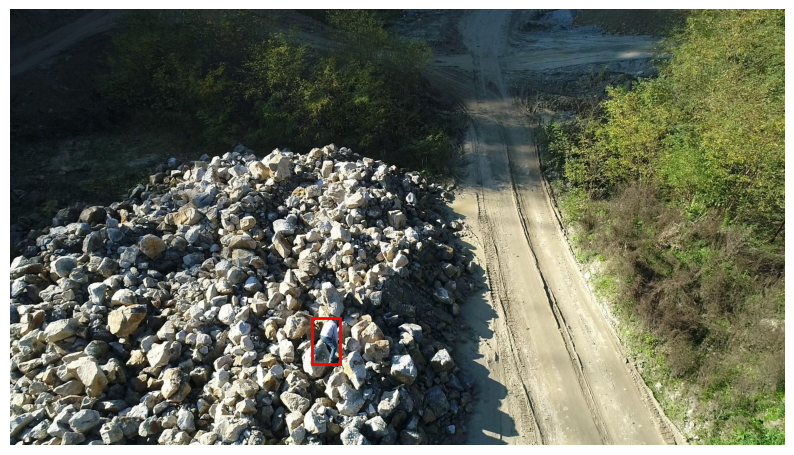

In [13]:
test_image = os.path.join(IMAGES_PATH, 'valid', os.listdir(os.path.join(IMAGES_PATH, 'valid'))[0])
results_test = model.predict(test_image, conf=0.25)[0]
img = PILImage.open(test_image)
plt.figure(figsize=(10, 10))
plt.imshow(img)
ax = plt.gca()
for bbox in results_test.boxes.xyxy:
    x1, y1, x2, y2 = bbox[:4].cpu().numpy()
    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2,
                           edgecolor='red', facecolor='none')
    ax.add_patch(rect)
plt.axis("off")
plt.show()


WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
image 1/1 /content/SARD/SARD/search-and-rescue-2/images/valid/gss55_jpg.rf.abeb9149aee484144eea0bdc47f77122.jpg: 384x640 1 Walking, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
image 1/1 /content/SARD/SARD/search-and-rescue-2/images/valid/gss1455_jpg.rf.f617d13260bc22da306637511c8aab80.jpg: 384x640 2 laying_downs, 10.9ms
Speed: 3.2ms preprocess, 10.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
image 1/1 /content/SARD/SARD/search-and-rescue-2/images/valid/gss215_jpg.rf.75c2821719ae66e6be26431055c567ee.jpg: 384x640 1 seated, 2 standss, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

WARNIN

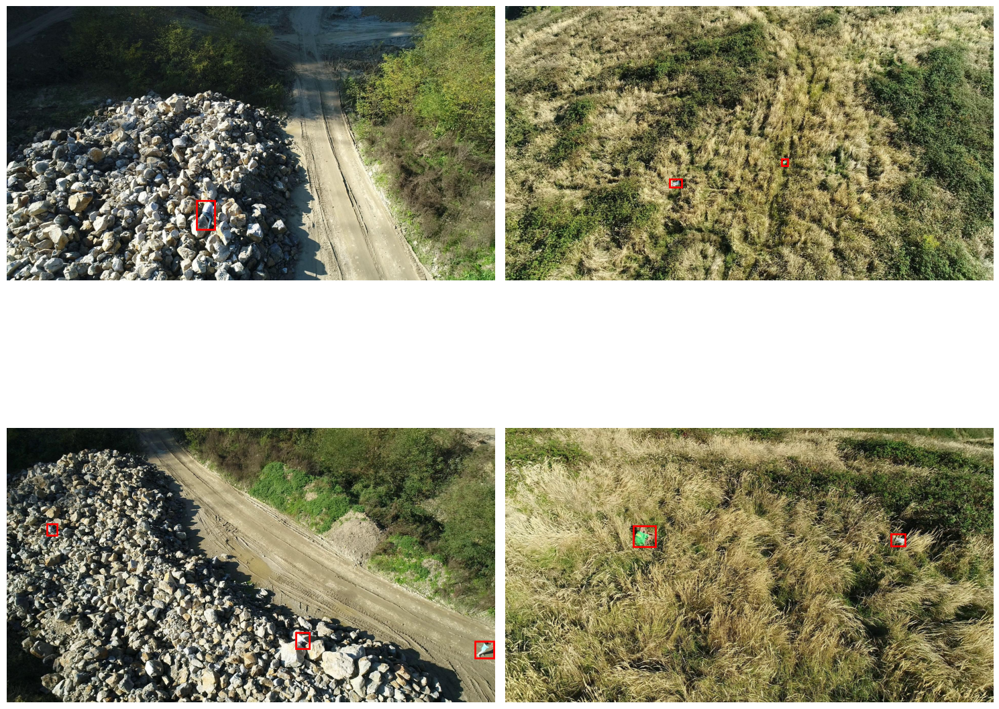

In [18]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image as PILImage

# Load 4 image file names from the 'valid' directory
valid_images = os.listdir(os.path.join(IMAGES_PATH, 'valid'))[:4]

# Create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(15, 15))

# Flatten axes array for easier looping
axs = axs.flatten()

# Loop over 4 images
for i, image_name in enumerate(valid_images):
    image_path = os.path.join(IMAGES_PATH, 'valid', image_name)

    # Run YOLOv8 prediction
    results_test = model.predict(image_path, conf=0.25)[0]

    # Open image
    img = PILImage.open(image_path)
    axs[i].imshow(img)
    axs[i].axis("off")

    # Draw bounding boxes
    for bbox in results_test.boxes.xyxy:
        x1, y1, x2, y2 = bbox[:4].cpu().numpy()
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                                 edgecolor='red', facecolor='none')
        axs[i].add_patch(rect)

plt.tight_layout()
plt.show()



WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
image 1/1 /content/SARD/SARD/search-and-rescue-2/images/valid/gss1356_jpg.rf.8a1a8e5798d6d1dd1cbb9ee8230fe3a3.jpg: 384x640 1 not_defined, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
image 1/1 /content/SARD/SARD/search-and-rescue-2/images/valid/gss1840_jpg.rf.d9af93cd146439468628656bcffe2b43.jpg: 384x640 1 Walking, 1 laying_down, 3 standss, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.
image 1/1 /content/SARD/SARD/search-and-rescue-2/images/valid/gss1877_jpg.rf.951d496a274def47e0a213813a69f00f.jpg: 384x640 1 Walking, 3 standss, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 0.5ms postprocess per image at sha

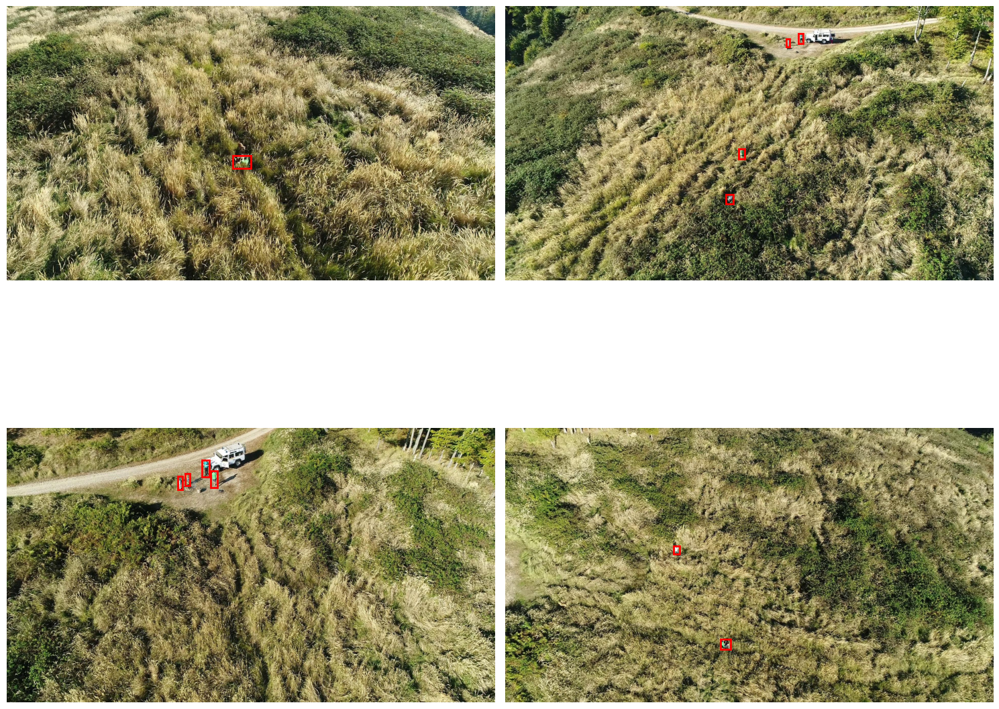

In [20]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image as PILImage

# Get all image filenames from the 'valid' folder
valid_dir = os.path.join(IMAGES_PATH, 'valid')
all_images = os.listdir(valid_dir)

# Randomly select 4 images
random_images = random.sample(all_images, 4)

# Create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
axs = axs.flatten()

# Loop over the 4 randomly selected images
for i, image_name in enumerate(random_images):
    image_path = os.path.join(valid_dir, image_name)

    # Run YOLOv8 prediction
    results_test = model.predict(image_path, conf=0.25)[0]

    # Open image
    img = PILImage.open(image_path)
    axs[i].imshow(img)
    axs[i].axis("off")

    # Draw bounding boxes
    for bbox in results_test.boxes.xyxy:
        x1, y1, x2, y2 = bbox[:4].cpu().numpy()
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                                 edgecolor='red', facecolor='none')
        axs[i].add_patch(rect)

plt.tight_layout()
plt.show()
